In [139]:
import pandas as pd
import numpy as np
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from collections import Counter
from plotly.offline import iplot
import matplotlib.pyplot as plt 
import plotly.offline as pyo
import plotly.graph_objs as go
from wordcloud import WordCloud, ImageColorGenerator
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
pyo.init_notebook_mode()

# Explorative Data Analysis on Interview Data of Startup Founders

##### Disclaimer: This notebook should be opened in a browser (rather than in an IDE) so that all graphics are displayed properly. #####

## 1. Look at Distribution of Outcome Variable (0 = failure, 1 = successful)

In [123]:
columns = ['from_idea_to_product',
           'growth_of_startup_and_customers',
            'idea_backstory_motivation',
            'marketing_strategies',
            'background_and_current_work',
           'challenges_obstacles_mistakes']

def plot_outcome_distribution(column):
    '''
    plots the number of failed and successful startups in a bar chart
    '''
    df = pd.read_csv('../../dat/' + column +'.csv')
    
    df.groupby('outcome_numeric')[column].count().iplot(
        kind='bar', 
        yTitle='Count', 
        linecolor='black', 
        opacity=0.8, 
        title='Bar Chart of Startup Outcome for' + column, 
        xTitle='outcome (0 = failure, 1 = success)')

startup_overall = pd.read_csv('../../dat/startup_data_final.csv')

startup_overall.groupby('outcome_numeric')[column].count().iplot(
        kind='bar', 
        yTitle='Count', 
        linecolor='black', 
        opacity=0.8, 
        title='Bar Chart of Startup Outcome for Overall Data', 
        xTitle='outcome (0 = failure, 1 = success)')

for column in columns:
    plot_outcome_distribution(column)

Insights:
- the variable "growth_of_startup_and_customers" is only available for one successful startup and thus will not be further used for analysis
- data is slightly imbalanced towards successful startups

## 2. Calculate and visualize sentiment scores

In [124]:
# Functions to calculate sentiment, text length and word count
def calculate_metrics(df, column):
    '''
    calculates the sentiment polarity, text length and word count
    for the specified question column and adds them to the data frame
    '''
    df['polarity'] = df[column].astype(str).map(lambda text: TextBlob(text).sentiment.polarity)
    df['text_len'] = df[column].astype(str).apply(len)
    df['word_count'] = df[column].apply(lambda x: len(str(x).split()))

def plot_sentiments(df, column, y):
    '''
    plots the calculated sentiment scores overall and filtered by y (predicted variable) 
    for the specified question column
    prints the highest and lowest sentiment score
    '''
    df['polarity'].iplot(
        kind='hist',
        bins=50,
        xTitle='polarity',
        linecolor='black',
        yTitle='count',
        title='Sentiment Polarity Distribution for: ' + column
        )

    print('Highest sentiment score:' + str(df['polarity'].max()))
    print('Lowest sentiment score:' + str(df['polarity'].min()))

    df.loc[df[y] == 0]['polarity'].iplot(
        kind='hist',
        bins=50,
        xTitle='polarity',
        linecolor='black',
        yTitle='count',
        title='Sentiment Polarity Distribution of Failed Startups for: ' + column
        )

    print('Highest sentiment score:' + str(df.loc[df[y] == 0]['polarity'].max()))
    print('Lowest sentiment score:' + str(df.loc[df[y] == 0]['polarity'].min()))


    df.loc[df[y] == 1]['polarity'].iplot(
        kind='hist',
        bins=50,
        xTitle='polarity',
        linecolor='black',
        yTitle='count',
        title='Sentiment Polarity Distribution of Successful Startups for: '  + column
        )

    print('Highest sentiment score:' + str(df.loc[df[y] == 1]['polarity'].max()))
    print('Lowest sentiment score:' + str(df.loc[df[y] == 1]['polarity'].min()))

### Calculate the sentiment scores based on outcome

In [125]:
columns_updated = ['from_idea_to_product',
            'idea_backstory_motivation',
            'marketing_strategies',
            'background_and_current_work',
           'challenges_obstacles_mistakes']

for column in columns_updated:
    df = pd.read_csv('../../dat/' + column +'.csv')
    calculate_metrics(df, column)
    plot_sentiments(df, column, 'outcome_numeric')

Highest sentiment score:0.39285714285714285
Lowest sentiment score:-0.14718614718614717


Highest sentiment score:0.3875
Lowest sentiment score:-0.10666666666666666


Highest sentiment score:0.39285714285714285
Lowest sentiment score:-0.14718614718614717


Highest sentiment score:0.5
Lowest sentiment score:-0.5


Highest sentiment score:0.5
Lowest sentiment score:-0.5


Highest sentiment score:0.37083333333333335
Lowest sentiment score:-0.16077777777777777


Highest sentiment score:0.5072115384615384
Lowest sentiment score:-0.2805555555555555


Highest sentiment score:0.38055555555555565
Lowest sentiment score:-0.2805555555555555


Highest sentiment score:0.5072115384615384
Lowest sentiment score:-0.13256172839506172


Highest sentiment score:0.65
Lowest sentiment score:-0.30350877192982456


Highest sentiment score:0.4407407407407407
Lowest sentiment score:-0.1375


Highest sentiment score:0.65
Lowest sentiment score:-0.30350877192982456


Highest sentiment score:0.4333333333333333
Lowest sentiment score:-0.24444444444444444


Highest sentiment score:0.31666666666666665
Lowest sentiment score:-0.24444444444444444


Highest sentiment score:0.4333333333333333
Lowest sentiment score:-0.12147435897435899


Insights:
- Sentiment scores are somewhat normally distributed around 0.1 or 0.2 --> founders do not speak particularly positive or negative about their ventures and corresponding ideas etc. but do have a slight tendency towards positive framing
- highest overall sentiment range: idea_backstory_and_motivation; lowest overall sentiment range: from_idea_to_product
- sentiment scores filtered for failed startups tend to be slighty lower, but overall not too big difference in sentiments --> might mean that it's difficult to predict success and failure from this data

### Calculate the sentiment scores based on gender

In order to check whether it might be helpful to consider another variable than outcome as explained / predicted variable, the sentiment scores filtered by gender are calculated.

In [126]:
for column in columns_updated:
    df = pd.read_csv('../../dat/' + column +'.csv')
    calculate_metrics(df, column)
    plot_sentiments(df, column, 'gender')

Highest sentiment score:0.39285714285714285
Lowest sentiment score:-0.14718614718614717


Highest sentiment score:0.39285714285714285
Lowest sentiment score:-0.14718614718614717


Highest sentiment score:0.31714285714285717
Lowest sentiment score:-0.010000000000000009


Highest sentiment score:0.5
Lowest sentiment score:-0.5


Highest sentiment score:0.40666666666666673
Lowest sentiment score:-0.5


Highest sentiment score:0.5
Lowest sentiment score:-0.043650793650793655


Highest sentiment score:0.5072115384615384
Lowest sentiment score:-0.2805555555555555


Highest sentiment score:0.5072115384615384
Lowest sentiment score:-0.2805555555555555


Highest sentiment score:0.3969444444444445
Lowest sentiment score:0.0658645276292335


Highest sentiment score:0.65
Lowest sentiment score:-0.30350877192982456


Highest sentiment score:0.65
Lowest sentiment score:-0.30350877192982456


Highest sentiment score:0.3006944444444445
Lowest sentiment score:-0.007773311344739915


Highest sentiment score:0.4333333333333333
Lowest sentiment score:-0.24444444444444444


Highest sentiment score:0.4333333333333333
Lowest sentiment score:-0.24444444444444444


Highest sentiment score:0.2983766233766234
Lowest sentiment score:-0.039395943562610246


Insight: Sentiment scores do not differ significantly when filtered by gender.

## 3. Distribution of Top Unigrams, Bigrams and Trigrams

In [127]:
def get_top_n_words(corpus, n=None):
    '''
    returns the frequency of the top n words of a corpus
    '''
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

def get_unigram_top_freq(column):
    '''
    prints the most frequent words (unigrams) to the console
    '''
    common_words_unigrams = get_top_n_words(df[column], 20)
    print('Top Unigrams for: ' + column)
    for word, freq in common_words_unigrams:
        print(word, freq)

def get_top_n_bigram(corpus, n=None):
    '''
    returns the frequency of the top n bigrams of a corpus
    '''
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

def get_bigram_top_freq(column):
    '''
    prints the most frequent bigrams to the console
    '''
    common_words = get_top_n_bigram(df[column], 20)
    print('Top Bigrams for: ' + column)
    for word, freq in common_words:
        print(word, freq)

def get_top_n_trigram(corpus, n=None):
    '''
    returns the frequency of the top n trigrams of a corpus
    '''
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

def get_trigram_top_freq(column):
    '''
    prints the most frequent trigrams to the console
    '''
    common_words = get_top_n_trigram(df[column], 20)
    print('Top Trigrams for: ' + column)
    for word, freq in common_words:
        print(word, freq)

for column in columns_updated:
    df = pd.read_csv('../../dat/' + column +'.csv')
    print('## Results for ' + column + ' ##')
    get_unigram_top_freq(column)
    print('\n')
    get_bigram_top_freq(column)
    print('\n')
    get_trigram_top_freq(column)
    print('\n')

## Results for from_idea_to_product ##
Top Unigrams for: from_idea_to_product
product 404
time 374
people 279
started 276
business 210
build 198
did 194
just 182
months 179
building 169
work 167
like 162
idea 158
got 154
wanted 148
didn 146
took 143
launch 141
customers 135
built 134


Top Bigrams for: from_idea_to_product
landing page 39
business model 23
product hunt 23
took months 23
started building 21
social media 19
building product 18
web app 17
didn want 16
started working 15
product market 15
ruby rails 14
lot time 14
initial product 13
thing did 13
willing pay 13
market fit 13
couple months 13
felt like 13
product development 13


Top Trigrams for: from_idea_to_product
product market fit 13
did enjoy process 7
process getting started 7
took months build 6
did launch publicize 5
simple landing page 5
launch publicize product 5
did run obstacles 4
did approach pricing 4
enjoy process getting 4
getting started building 4
launched product hunt 4
resources tools did 4
tools did us

Insights:
- Very generic top words --> I should remove the top five unigrams and top three bigrams as they appear very frequently across all texts and do not give many insights.

## 4. Sentiment based on outcome of startup

In [128]:
for column in columns_updated:
    df = pd.read_csv('../../dat/' + column + '.csv')
    calculate_metrics(df, column)

    y0 = df.loc[df['outcome_numeric'] == 0]['polarity']
    y1 = df.loc[df['outcome_numeric'] == 1]['polarity']

    trace0 = go.Box(
        y=y0,
        name = 'Failed startups',
        marker = dict(
            color = 'rgb(214, 12, 140)',
        )
    )
    trace1 = go.Box(
        y=y1,
        name = 'Successful startups',
        marker = dict(
            color = 'rgb(0, 128, 128)',
        )
    )

    data = [trace0, trace1]
    layout = go.Layout(
        title = "Sentiment Polarity Boxplot for " + column
    )

    fig = go.Figure(data=data, layout=layout)
    iplot(fig, filename = "Sentiment Polarity Boxplot")

Insights: 
- based on visual interpretation of the boxplots, the interview questions about background and current work as well as about marketing strategies have the most differing sentiments when comparing answers from failed and succesful founders

## 5. Distribution of Sentiment Polarity Score by Outcome

In [129]:
for column in columns_updated:
    df = pd.read_csv('../../dat/' + column + '.csv')
    calculate_metrics(df, column)
    
    x1 = df.loc[df['outcome_numeric'] == 1, 'polarity']
    x0 = df.loc[df['outcome_numeric'] == 0, 'polarity']

    trace1 = go.Histogram(
        x=x0, name='Failed Startup',
        opacity=0.75
    )
    trace2 = go.Histogram(
        x=x1, name = 'Successful Startup',
        opacity=0.75
    )

    data = [trace1, trace2]
    layout = go.Layout(barmode='overlay', title='Distribution of Sentiment polarity based on Outcome for: ' + column)
    fig = go.Figure(data=data, layout=layout)

    iplot(fig, filename='overlaid histogram')

## 6. Topic Modeling the Founders' Answers

Before implementing the algorithm for predicting startup outcome (i.e. success and failure) with the supervised heterogenous topic model by Blei et. al. (2022) it is feasible to take a look at unsupervised topic modeling. 

In [130]:
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

def get_top_n_words_for_topics(n, keys, document_term_matrix, tfidf_vectorizer):
    '''
    returns a list of n_topic strings, where each string contains the n most common 
    words in a predicted category, in order
    '''
    top_word_indices = []
    for topic in range(n_topics):
        temp_vector_sum = 0
        for i in range(len(keys)):
            if keys[i] == topic:
                temp_vector_sum += document_term_matrix[i]
        temp_vector_sum = temp_vector_sum.toarray()
        top_n_word_indices = np.flip(np.argsort(temp_vector_sum)[0][-n:],0)
        top_word_indices.append(top_n_word_indices)   
    top_words = []
    for topic in top_word_indices:
        topic_words = []
        for index in topic:
            temp_word_vector = np.zeros((1,document_term_matrix.shape[1]))
            temp_word_vector[:,index] = 1
            the_word = tfidf_vectorizer.inverse_transform(temp_word_vector)[0][0]
            topic_words.append(the_word.encode('ascii').decode('utf-8'))
        top_words.append(" ".join(topic_words))         
    return top_words

def print_topics(top_n_words):
    '''
    prints the topics and the corresponding top n words
    '''
    for i in range(len(top_n_words)):
        print("Topic {}: ".format(i+1), top_n_words[i])
        
def visualize_topics(keys, dtm, vectorizer, categories, counts):
    '''
    visualizes the topics and the corresponding number of documents in which
    they appear as a bar chart
    '''
    top_3_words = get_top_n_words_for_topics(3, keys, dtm, vectorizer)
    labels = ['Topic {}: \n'.format(i) + top_3_words[i] for i in categories]
    
    fig, ax = plt.subplots(figsize=(16,8))
    ax.bar(categories, counts);
    ax.set_xticks(categories);
    ax.set_xticklabels(labels);
    ax.set_ylabel('Number of question text');
    ax.set_title('Topic counts');
    plt.show();

Topics LSA for: from_idea_to_product
Topic 1:  product time people
Topic 2:  product exposure public
Topic 3:  app athletes playdate


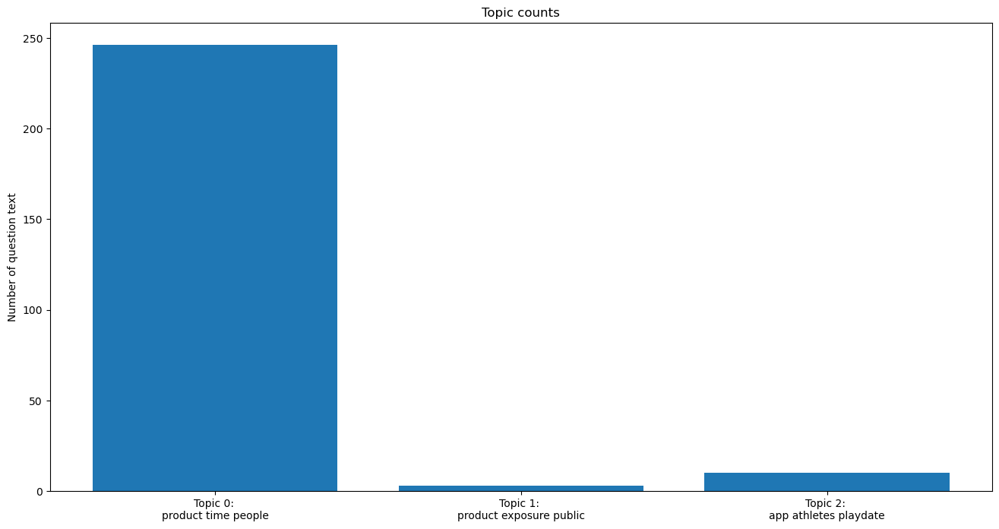



Topics LDA for: from_idea_to_product
Topic 1:  time product people
Topic 2:  app product time
Topic 3:  product time started


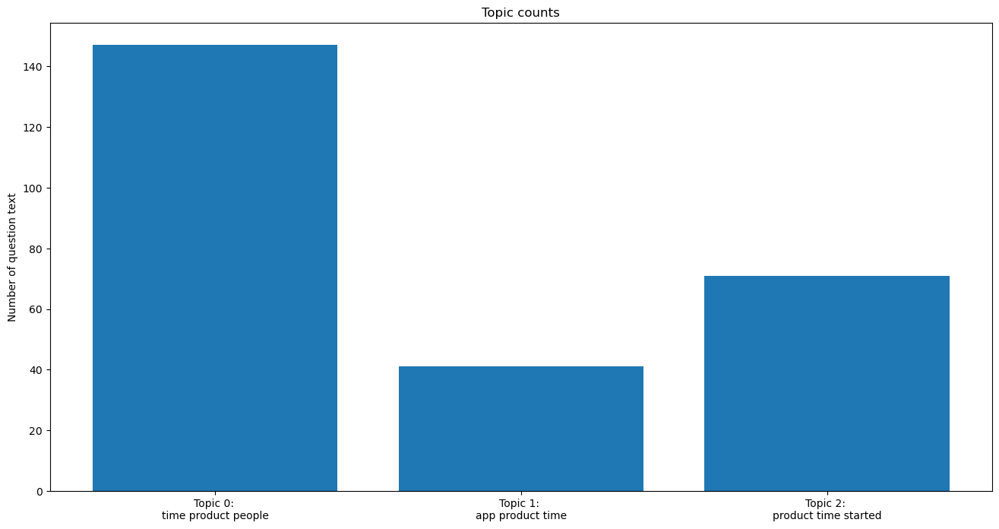



Topics LSA for: idea_backstory_motivation
Topic 1:  business time started
Topic 2:  asktina readers install
Topic 3:  impossible list writing


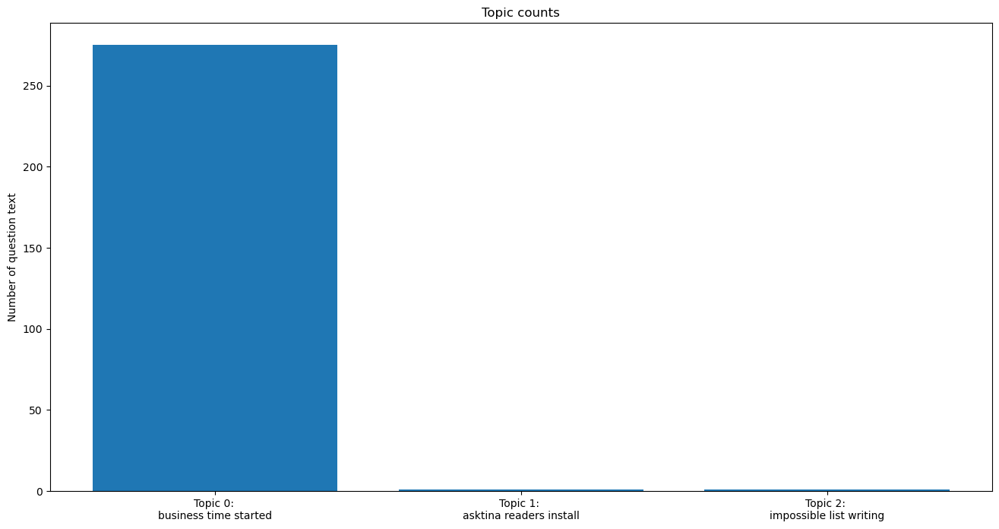



Topics LDA for: idea_backstory_motivation
Topic 1:  time started business
Topic 2:  time business idea
Topic 3:  business time started


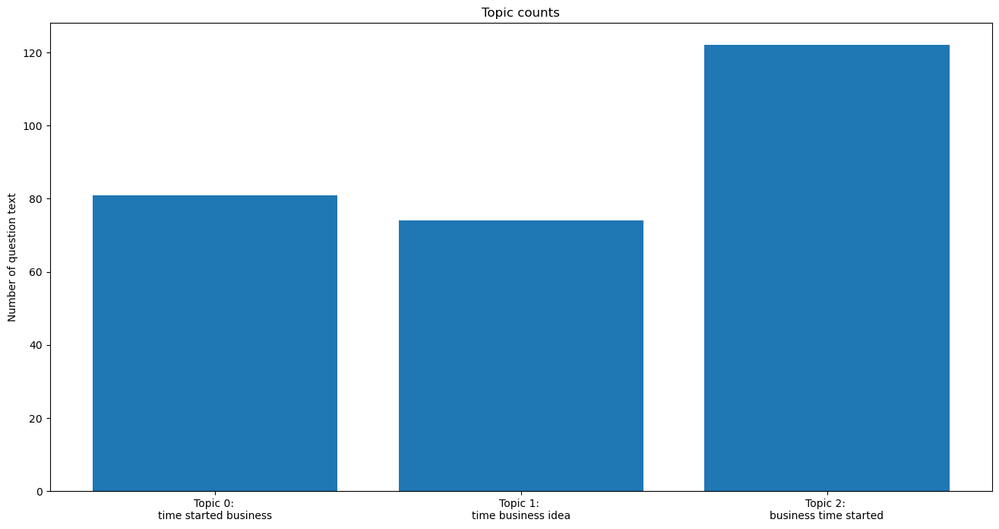



Topics LSA for: marketing_strategies
Topic 1:  marketing people product
Topic 2:  hunt product launch
Topic 3:  photopea facebook loosely


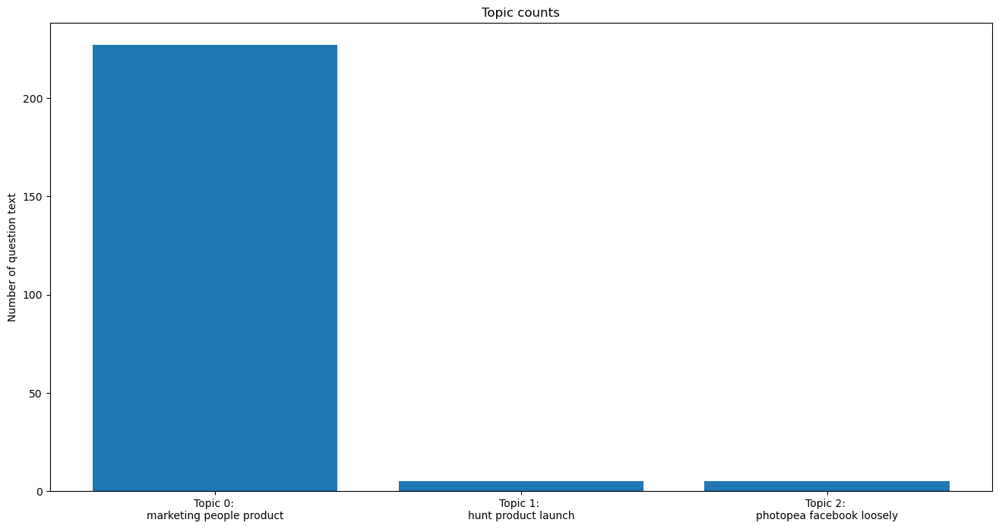



Topics LDA for: marketing_strategies
Topic 1:  marketing product people
Topic 2:  marketing people product
Topic 3:  marketing product people


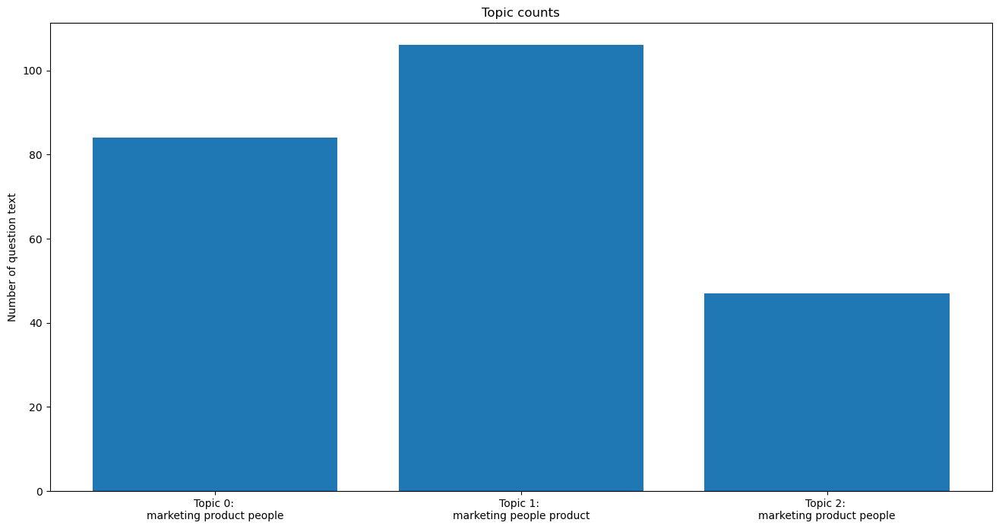



Topics LSA for: background_and_current_work
Topic 1:  business years company
Topic 2:  based client founder
Topic 3:  manager product marketing


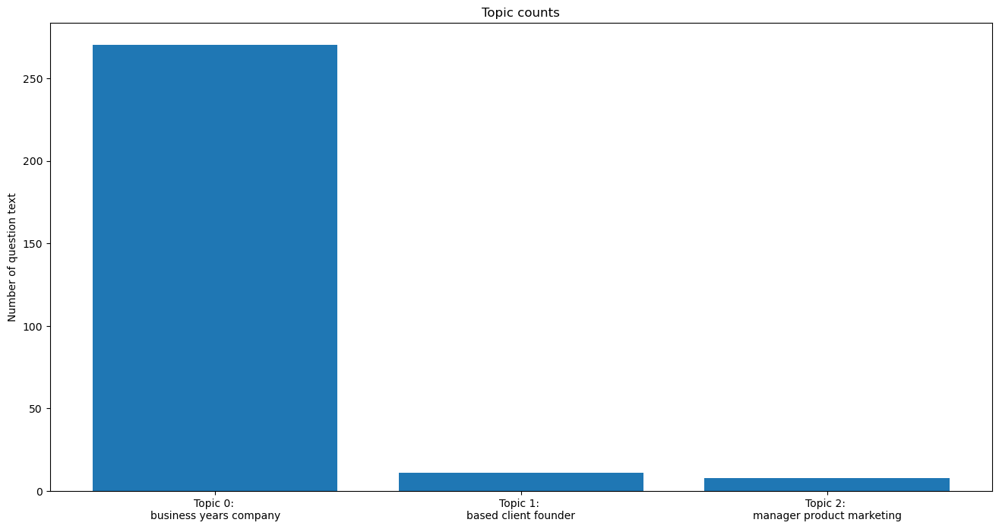



Topics LDA for: background_and_current_work
Topic 1:  business years ve
Topic 2:  years business company
Topic 3:  business years ve


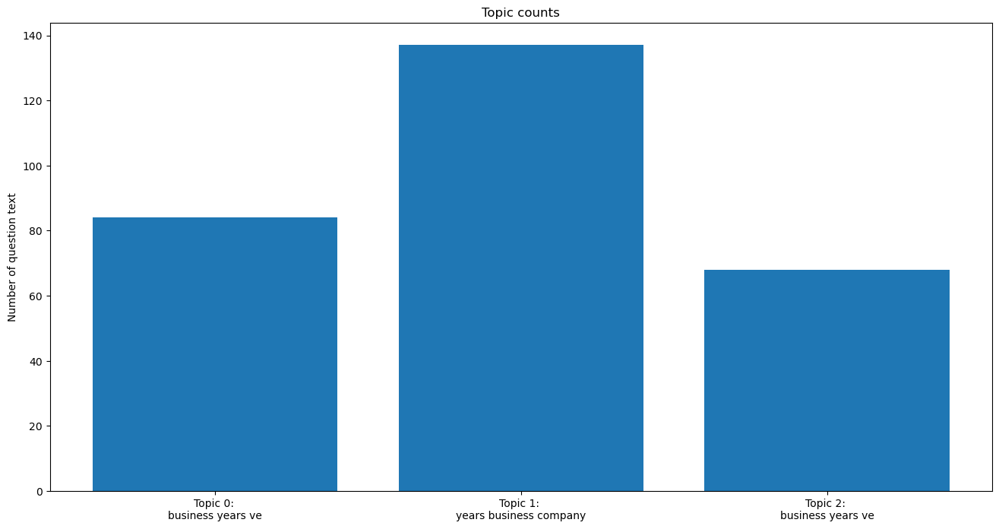



Topics LSA for: challenges_obstacles_mistakes
Topic 1:  time business product
Topic 2:  product having user
Topic 3:  products communities challenge


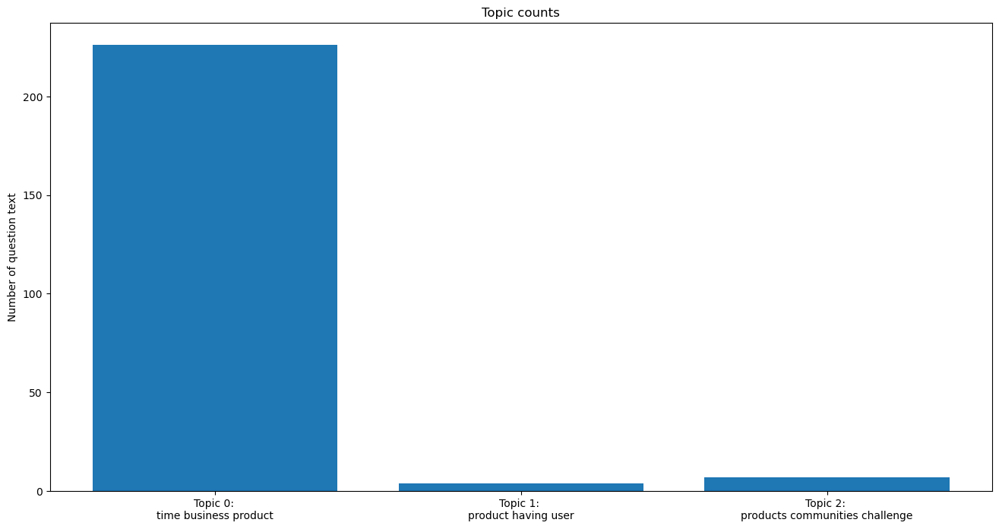



Topics LDA for: challenges_obstacles_mistakes
Topic 1:  time product people
Topic 2:  time lot product
Topic 3:  time business work


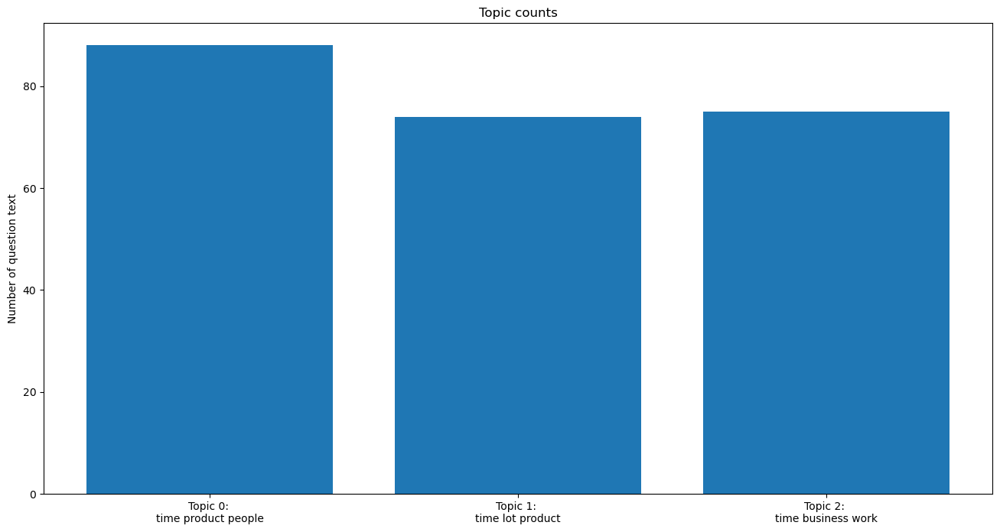

In [140]:
for column in columns_updated:
    df = pd.read_csv('../../dat/' + column + '.csv')
    reindexed_data = df[column]
    
    tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, smooth_idf=True, max_df=0.8, min_df=0.0007)
    count_vectorizer = CountVectorizer(stop_words='english', ngram_range=(1, 1), max_df=0.8, min_df=0.0007)
    
    reindexed_data = reindexed_data.values
    document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)
    document_term_matrix_bow = count_vectorizer.fit_transform(reindexed_data)
    
    n_topics = 3
    # LSA
    lsa_model = TruncatedSVD(n_components=n_topics)
    lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)

    lsa_keys = get_keys(lsa_topic_matrix)
    lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

    top_n_words_lsa = get_top_n_words_for_topics(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
    
    # LDA
    lda_model = LatentDirichletAllocation(n_components=n_topics)
    lda_topic_matrix = lda_model.fit_transform(document_term_matrix_bow)
    
    lda_keys = get_keys(lda_topic_matrix)
    lda_categories, lda_counts = keys_to_counts(lda_keys)
    
    top_n_words_lda = get_top_n_words_for_topics(3, lda_keys, document_term_matrix_bow, count_vectorizer)

    print("Topics LSA for: " + column)
    print_topics(top_n_words_lsa)
    visualize_topics(lsa_keys, document_term_matrix, tfidf_vectorizer, lsa_categories, lsa_counts)
    print("\n")
    
    print("Topics LDA for: " + column)
    print_topics(top_n_words_lda)
    visualize_topics(lda_keys, document_term_matrix_bow, count_vectorizer, lda_categories, lda_counts)
    print("\n")

Insights: 
- It seems to be the case that in each interview question, the founders are answering with one specific topic in mind. This topic overshadows the other topics.
- In order to explore other topics, I could lower the maximum td-idf.  

Topics LSA for: from_idea_to_product
Topic 1:  product people started
Topic 2:  product users vimcal
Topic 3:  app native playdate


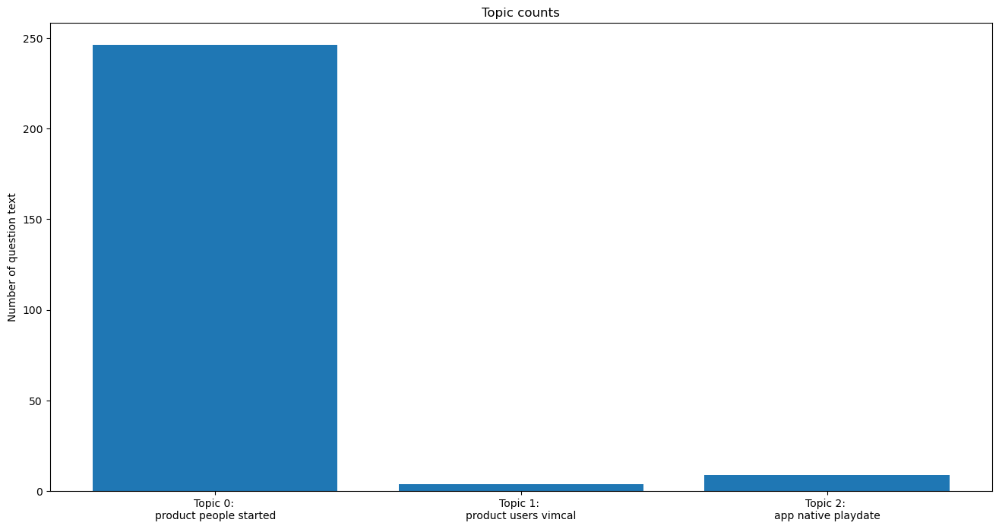



Topics LDA for: from_idea_to_product
Topic 1:  started product people
Topic 2:  product started people
Topic 3:  product people started


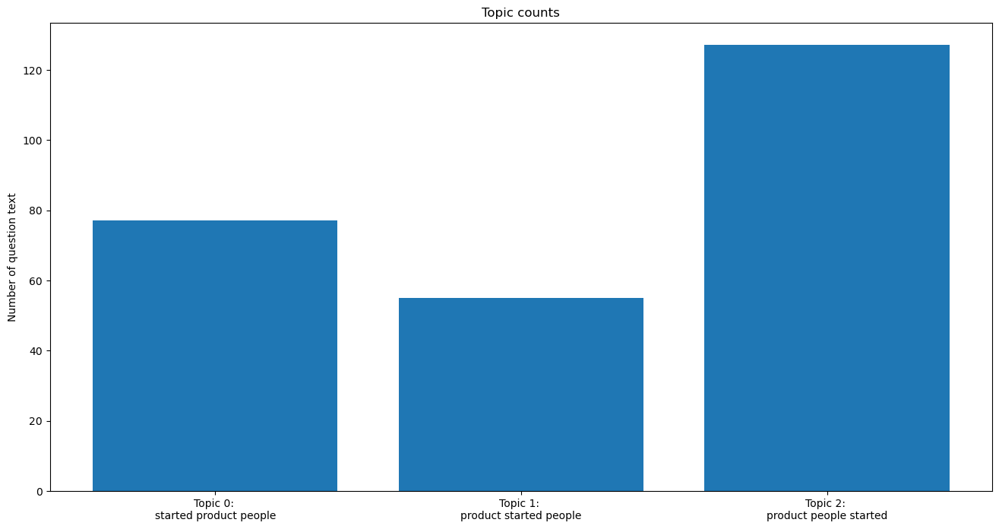



Topics LSA for: idea_backstory_motivation
Topic 1:  business started idea
Topic 2:  send phoenix asktina
Topic 3:  growth client marketmuse


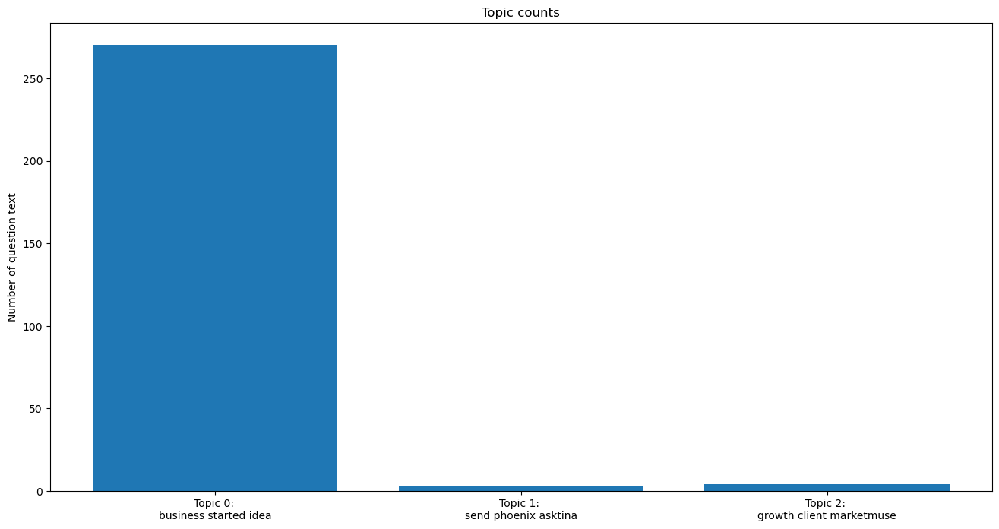



Topics LDA for: idea_backstory_motivation
Topic 1:  business started company
Topic 2:  business started people
Topic 3:  idea started years


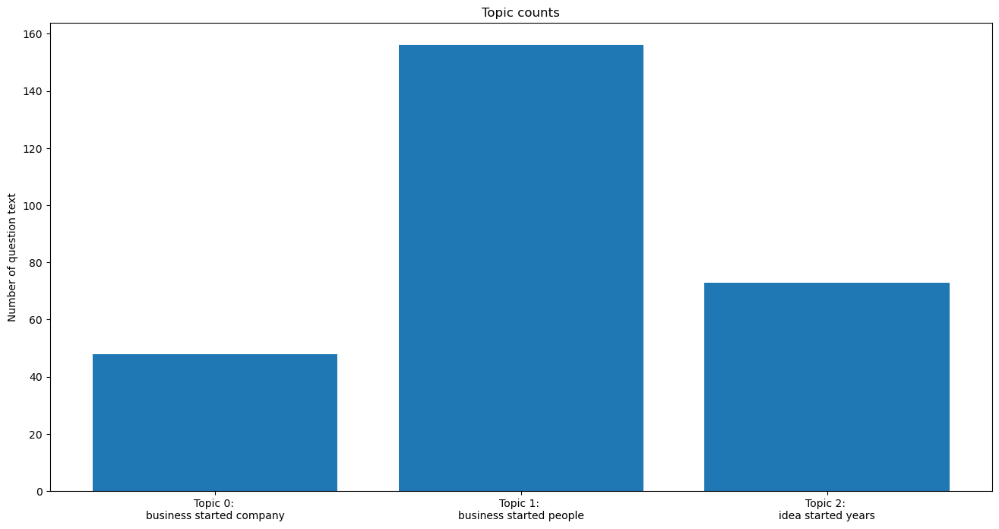



Topics LSA for: marketing_strategies
Topic 1:  people product ve
Topic 2:  hunt product launch
Topic 3:  loosely facebook direction


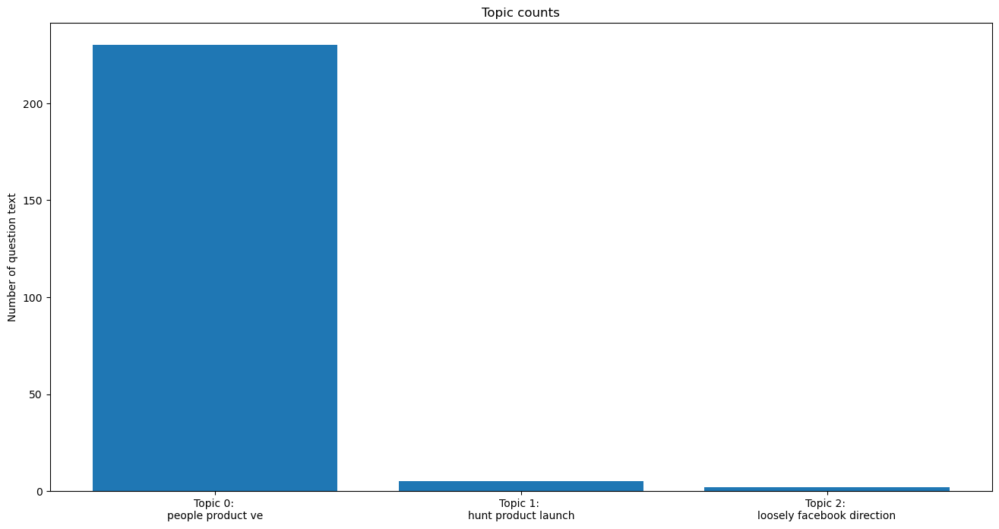



Topics LDA for: marketing_strategies
Topic 1:  people product ve
Topic 2:  people time product
Topic 3:  people product lot


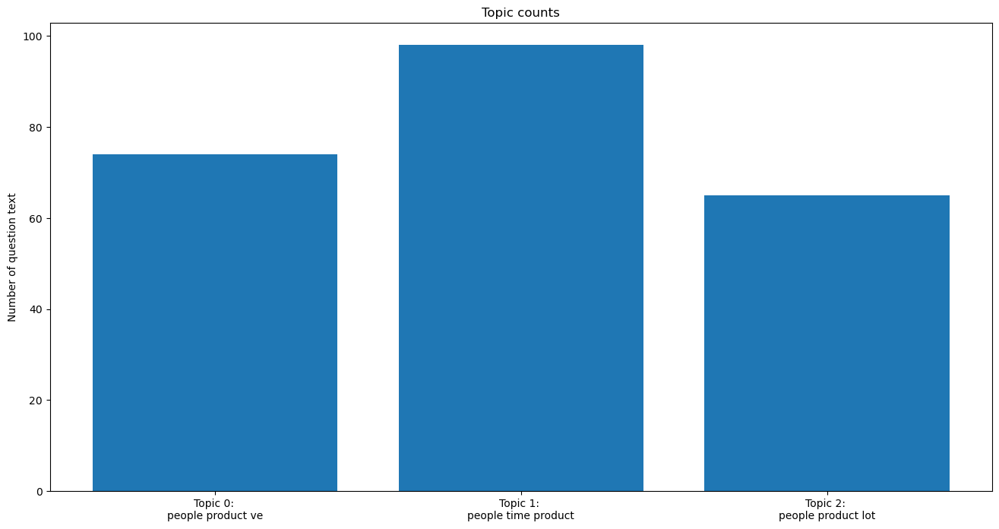



Topics LSA for: background_and_current_work
Topic 1:  business years company
Topic 2:  films film festivilia
Topic 3:  manager product marketing


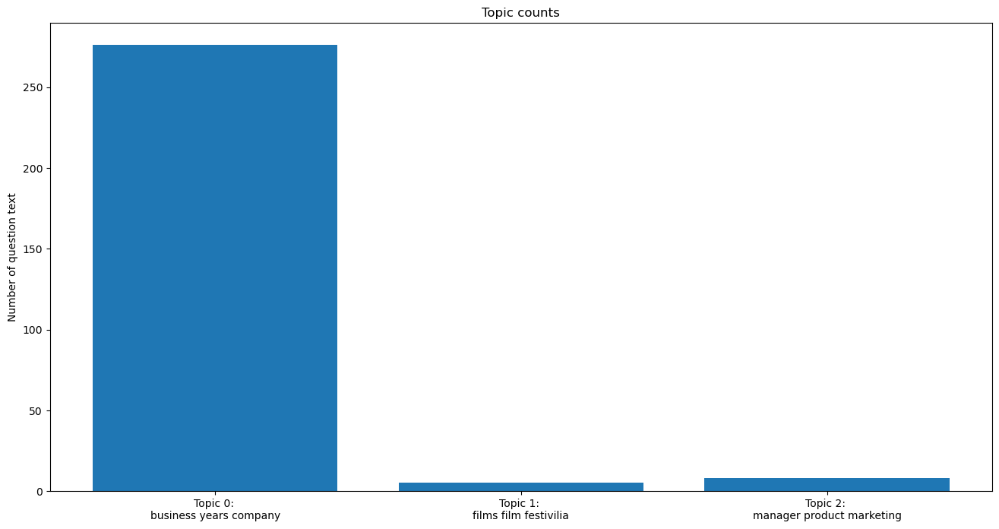



Topics LDA for: background_and_current_work
Topic 1:  business time like
Topic 2:  years company business
Topic 3:  business years time


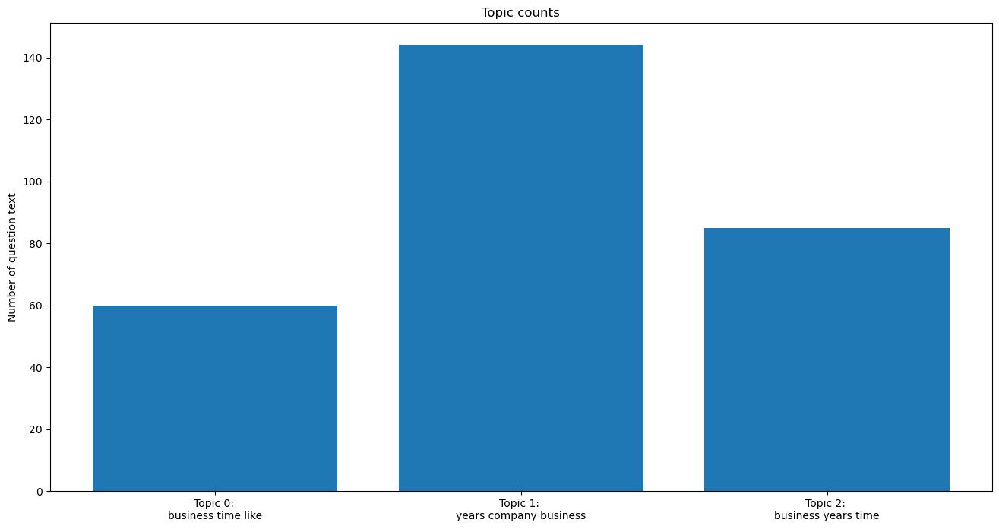



Topics LSA for: challenges_obstacles_mistakes
Topic 1:  business product work
Topic 2:  product user having
Topic 3:  success startup app


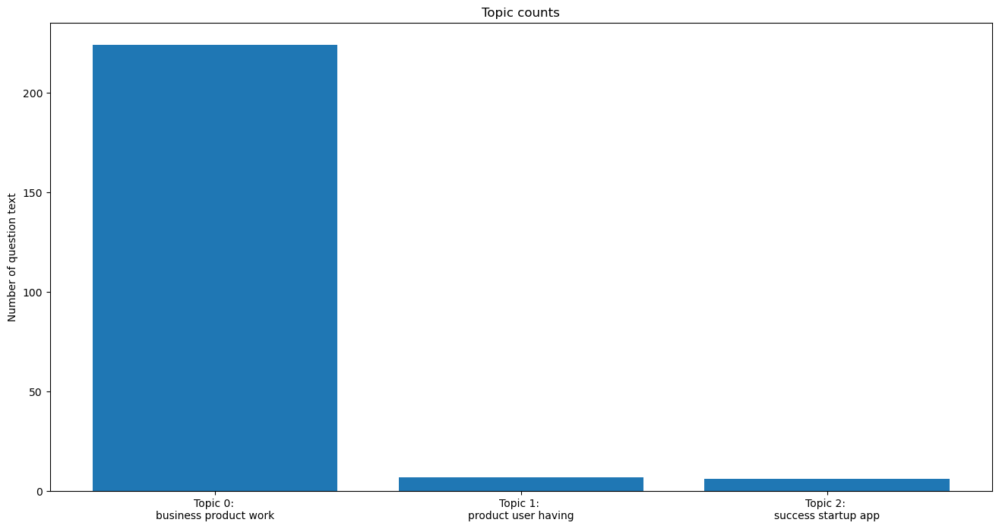



Topics LDA for: challenges_obstacles_mistakes
Topic 1:  business product biggest
Topic 2:  business ve people
Topic 3:  product people work


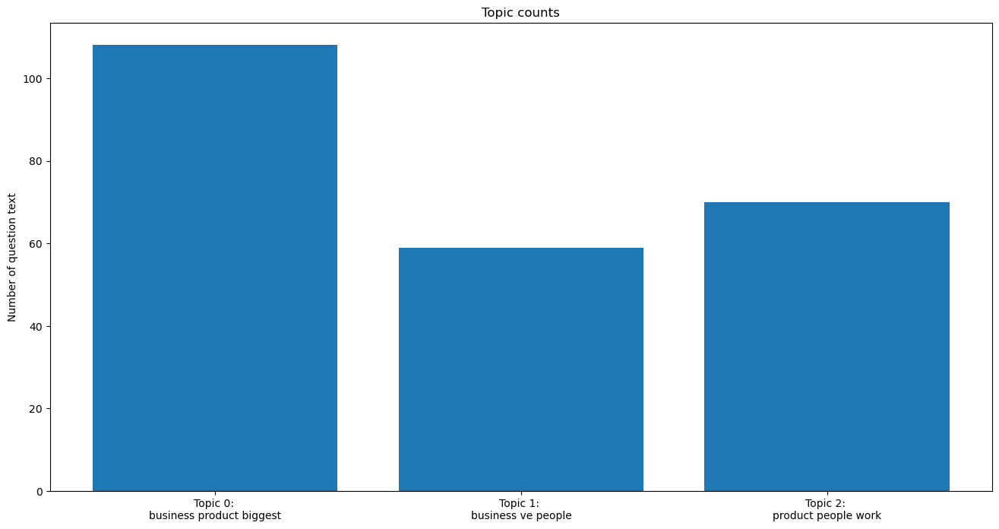

In [141]:
### Reproduce results with lower td-idf

for column in columns_updated:
    df = pd.read_csv('../../dat/' + column + '.csv')
    reindexed_data = df[column]
    
    tfidf_vectorizer = TfidfVectorizer(stop_words='english', use_idf=True, smooth_idf=True, max_df=0.6, min_df=0.0007)
    count_vectorizer = CountVectorizer(stop_words='english', ngram_range=(1, 1), max_df=0.6, min_df=0.0007)
    
    reindexed_data = reindexed_data.values
    document_term_matrix = tfidf_vectorizer.fit_transform(reindexed_data)
    document_term_matrix_bow = count_vectorizer.fit_transform(reindexed_data)
    
    n_topics = 3
    # LSA
    lsa_model = TruncatedSVD(n_components=n_topics)
    lsa_topic_matrix = lsa_model.fit_transform(document_term_matrix)

    lsa_keys = get_keys(lsa_topic_matrix)
    lsa_categories, lsa_counts = keys_to_counts(lsa_keys)

    top_n_words_lsa = get_top_n_words_for_topics(3, lsa_keys, document_term_matrix, tfidf_vectorizer)
    
    # LDA
    lda_model = LatentDirichletAllocation(n_components=n_topics)
    lda_topic_matrix = lda_model.fit_transform(document_term_matrix_bow)
    
    lda_keys = get_keys(lda_topic_matrix)
    lda_categories, lda_counts = keys_to_counts(lda_keys)
    
    top_n_words_lda = get_top_n_words_for_topics(3, lda_keys, document_term_matrix_bow, count_vectorizer)

    print("Topics LSA for: " + column)
    print_topics(top_n_words_lsa)
    visualize_topics(lsa_keys, document_term_matrix, tfidf_vectorizer, lsa_categories, lsa_counts)
    print("\n")
    
    print("Topics LDA for: " + column)
    print_topics(top_n_words_lda)
    visualize_topics(lda_keys, document_term_matrix_bow, count_vectorizer, lda_categories, lda_counts)
    print("\n")

Insights: 
- It seems as it will be quite hard to use the text bodies at hand for prediction of the success or failure of a startup. However, this analysis shows that it will be important to treat the td-idf as a hyperparameter and try to tune it for the model.

## 7. WordClouds

In [136]:
def generate_wordcloud(freq_words):
    wordcloud = WordCloud(width=1600, height=800, background_color='white').generate(str(freq_words))
    fig = plt.figure(figsize=(30,10), facecolor='white')
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title('Most Common Words', fontsize=100)
    plt.tight_layout(pad=0)
    plt.show()

from_idea_to_product
--------------------------------------------------------------------------------


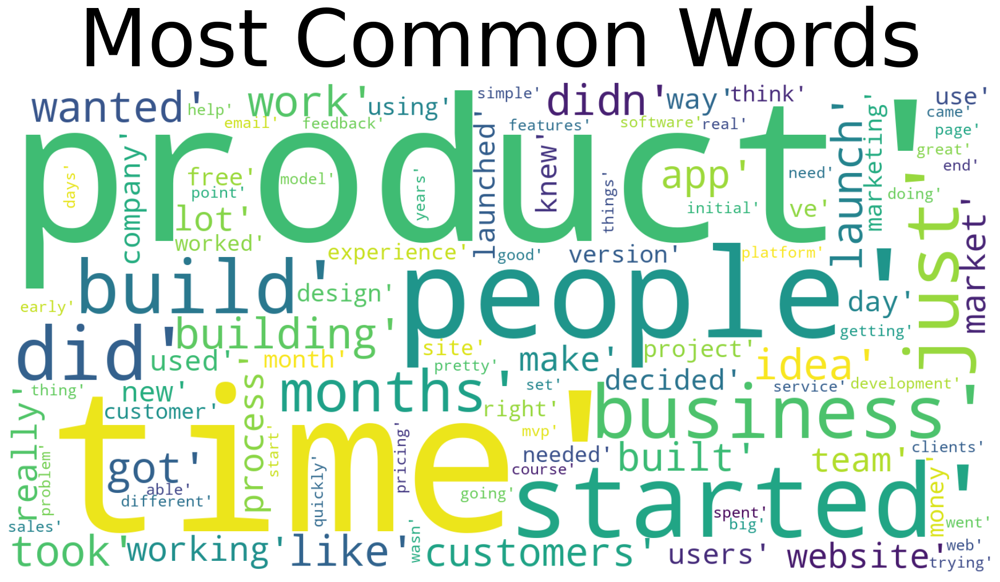

--------------------------------------------------------------------------------


idea_backstory_motivation
--------------------------------------------------------------------------------


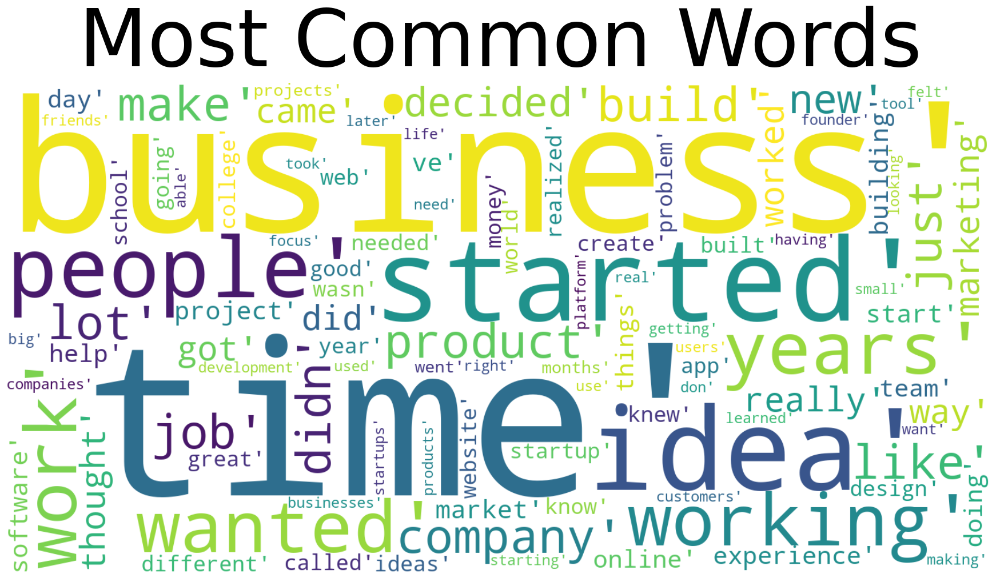

--------------------------------------------------------------------------------


marketing_strategies
--------------------------------------------------------------------------------


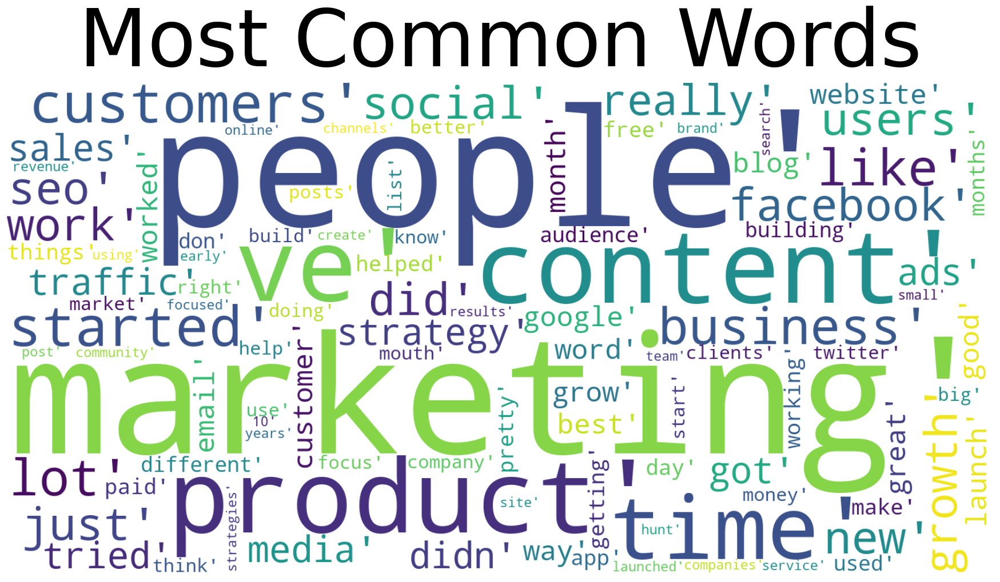

--------------------------------------------------------------------------------


background_and_current_work
--------------------------------------------------------------------------------


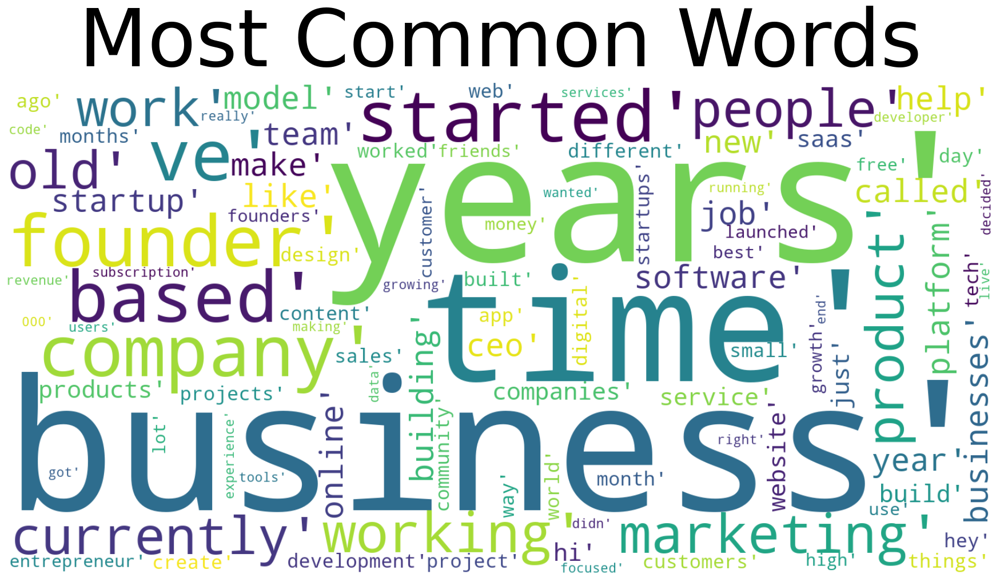

--------------------------------------------------------------------------------


challenges_obstacles_mistakes
--------------------------------------------------------------------------------


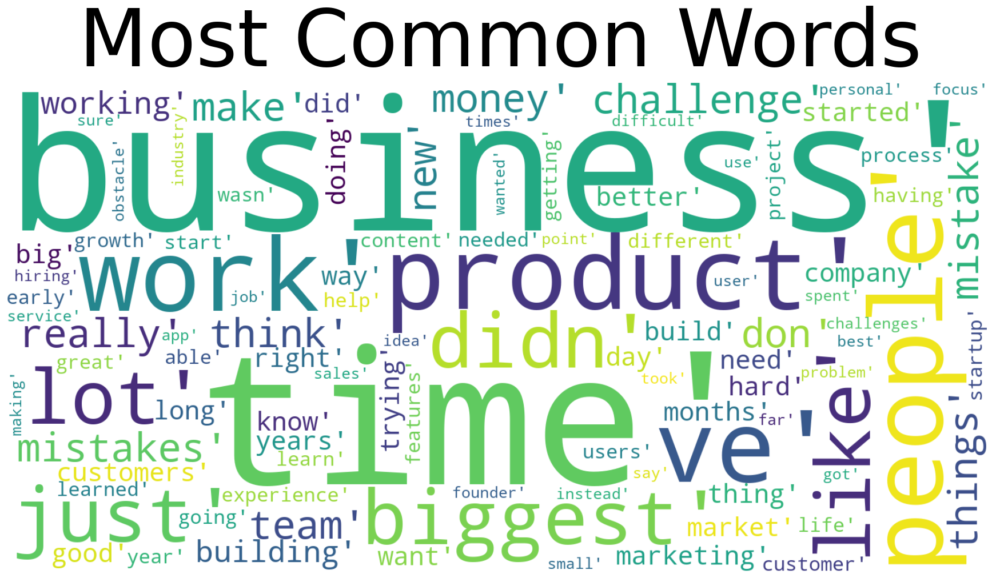

--------------------------------------------------------------------------------




In [138]:
for column in columns_updated:
    df = pd.read_csv('../../dat/' + column +'.csv')
    words = get_top_n_words(df[column], 100)
    
    mostcommon = FreqDist(words).most_common(100)
    
    print(column)
    print('--------------------------------------------------------------------------------')
    generate_wordcloud(mostcommon)
    print('--------------------------------------------------------------------------------')
    print('\n')
    